In [1]:
from __future__ import division, unicode_literals, print_function  # for compatibility with Python 2 and 3

import matplotlib as mpl 
import matplotlib.pyplot as plt
from matplotlib import rc
from matplotlib.animation import FuncAnimation

%matplotlib inline
%load_ext autoreload
%autoreload 2

# Optionally, tweak styles.
mpl.rc('figure',  figsize=(10, 5))
import numpy as np
import pandas as pd
from pandas import DataFrame, Series  # for convenience
import os
import seaborn as sns
# equivalent to rcParams['animation.html'] = 'html5'
rc('animation', html='html5')
import pims
import pySPM as spm 
import trackpy as tp
import glob
from sxmreader import SXMReader
net_file = '../moire_walk/models/classification_model_30_tmp.h5'

In [2]:
n_range = range(205, 205+200)
N = len(n_range)
SXM_PATH = ["electromigration_30/Image_{0:03}.sxm".format(i) for i in n_range]
frames = SXMReader(SXM_PATH)
molecule_size = 9
detect_kwargs = {
    'minmass' : 2,
    'maxsize' : 4,
    'separation' : 7,
}
f = tp.batch(frames[:], molecule_size, **detect_kwargs)

Frame 199: 14 features


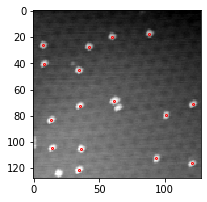

(-0.5, 127.5, 127.5, -0.5)

In [3]:
fig=plt.figure(figsize=(3, 5))
idx = 12
ax = tp.annotate(f[f['frame']==idx], frames[idx], plot_style={'markersize':1})
ax.axis('off')

Frame 199: 14 trajectories present.


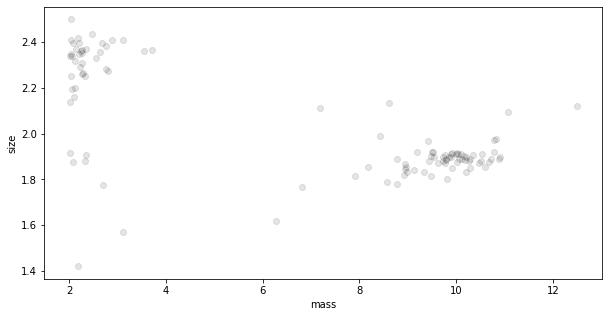

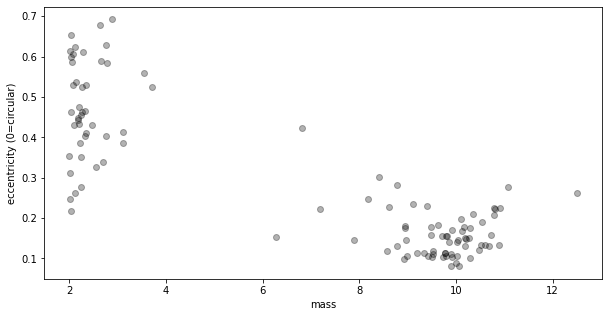

In [4]:
search_kws = {
    'search_range' : 35,
    'adaptive_stop' : 2.0,
    'adaptive_step' : 0.95,
}
t = tp.link(f, **search_kws)
plt.figure()
tp.mass_size(t.groupby('particle').mean()); # convenience function -- just plots size vs. mass
tp.mass_ecc(t.groupby('particle').mean()); # convenience function -- just plots size vs. mass

In [5]:
min_mass, max_mass = 9, 13
min_size, max_size = 1.8, 2.2
min_ecc, max_ecc = 0.05, 0.25
t1 = t[t['ecc'].between(min_ecc, max_ecc) &
       t['size'].between(min_size, max_size) & 
       t['mass'].between(min_mass, max_mass)]
t2 = tp.filter_stubs(t, 180)
# Compare the number of particles in the unfiltered and filtered data.
print('Before:', t['particle'].nunique())
print('After:', t2['particle'].nunique())

Before: 109
After: 9


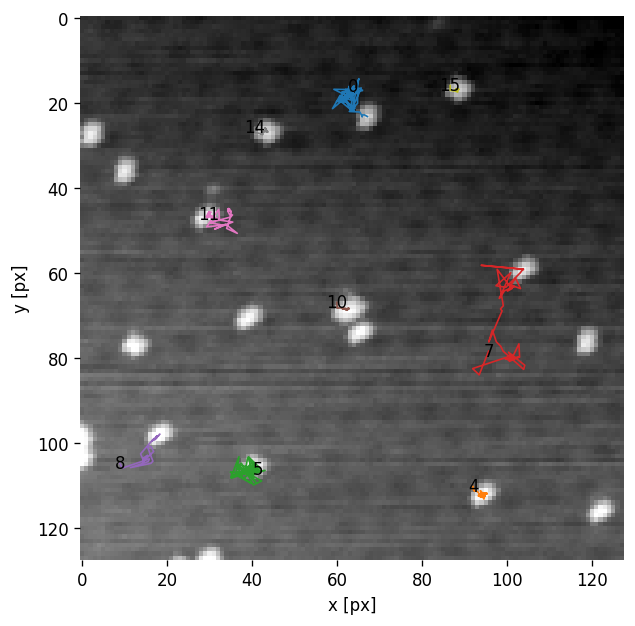

In [6]:
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig=plt.figure(figsize=(8, 6), dpi=120)
ax1=plt.axes(xlim=(0, 256), ylim=(0, 256), frameon=False)
plt.axis('off')
ln, = ax1.plot([], [], lw=3)
ax1.set_prop_cycle(color=['g', 'r', 'c', 'm', 'y', 'k'])
def animate(i):
    plt.cla()
    tp.plot_traj(t2[(t2['frame']<=i+20)], superimpose=frames[i+20], label=True, ax=ax1, plot_style={'alpha' : 1})
    ax1.set_prop_cycle(color=['g', 'r', 'c', 'm', 'y', 'k'])
#     plt.imshow(frames[i], cmap='gray')
# Set up formatting for the movie files
Writer = matplotlib.animation.writers['ffmpeg']
writer = Writer(fps=5, metadata=dict(artist='Me'), bitrate=1800)
line_ani = matplotlib.animation.FuncAnimation(fig, animate, frames=30)
# line_ani.save('claymation.mp4', writer=writer)
line_ani

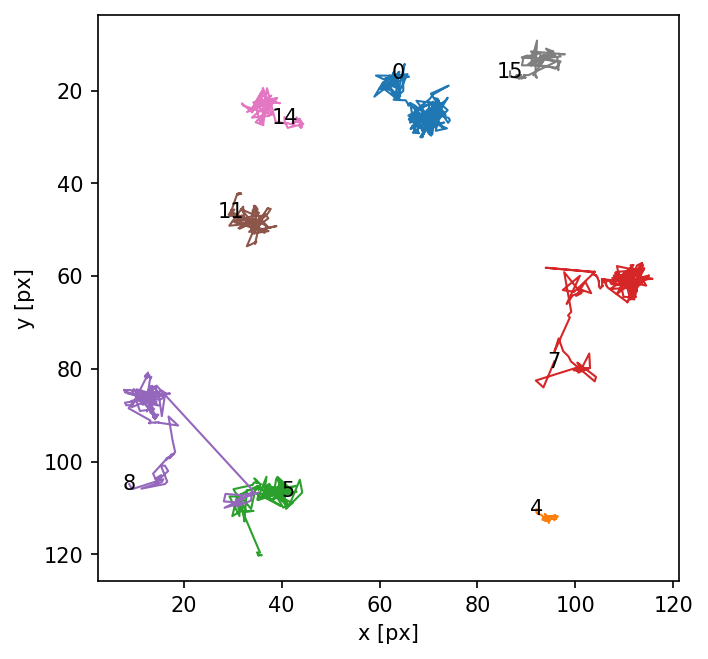

<AxesSubplot:xlabel='x [px]', ylabel='y [px]'>

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(5,5))
t2 = t2[~t2.particle.isin([10])] # 10 is double molecule, 11 is near a defect
tp.plot_traj(t2, label=True)

# MSD

In [8]:
d = tp.compute_drift(t2)
tm = tp.subtract_drift(t2.copy(), d)
tm.head(3)

,y,x,mass,size,ecc,orientation,angle,signal,raw_mass,ep,frame,particle
frame,,,,,,,,,,,,
0,16.092504,63.861776,10.188958,1.860785,0.079690,1.615025,1.615025,0.690639,-6.422691,-0.068778,0,0
0,110.271211,92.027898,9.417067,1.918830,0.122035,-0.371797,-0.371797,0.633763,17.569814,0.035789,0,4
0,106.241011,41.377528,9.641864,1.907113,0.101027,1.489833,1.489833,0.622929,22.655727,0.027066,0,5


(0.0, 25.0)

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


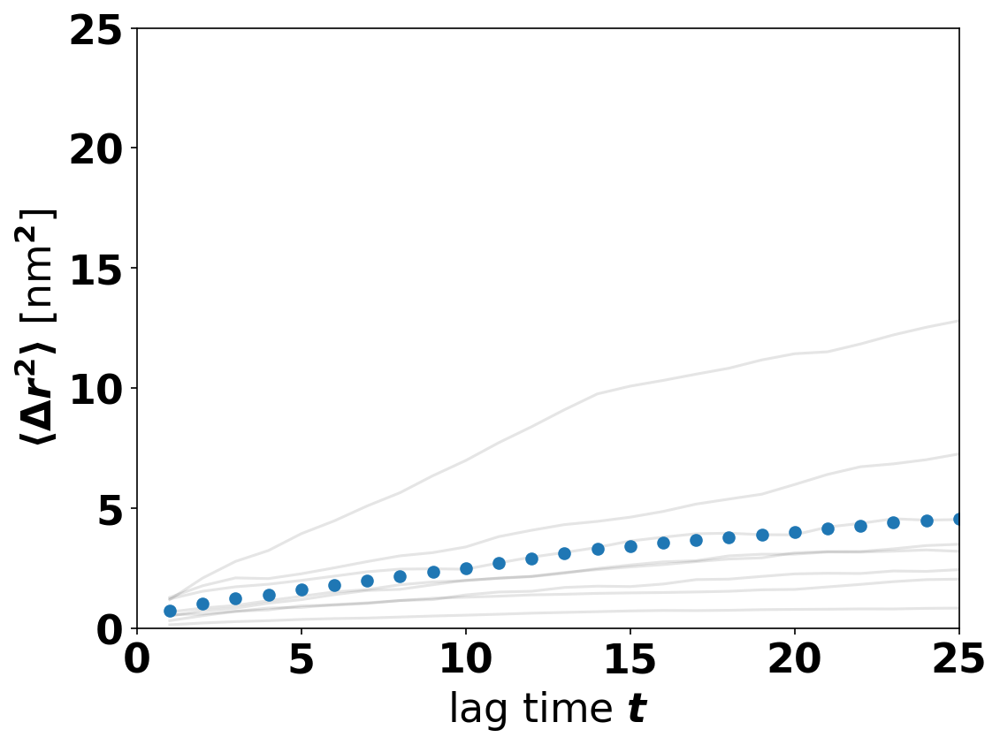

In [9]:
im = tp.imsd(tm, frames.meters_per_pixel * 1e6, 1) * 1e6
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}
import matplotlib
matplotlib.rc('font', **font)
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
ax.plot(im.index, im , 'k-', alpha=0.1)  # black lines, semitransparent
ax.set(ylabel=r'$\langle \Delta r^2 \rangle$ [nm$^2$]',
       xlabel='lag time $t$')
# ax.set_xscale('log')
# ax.set_yscale('log')
em = tp.emsd(tm, frames.meters_per_pixel * 1e6, 1) * 1e6
ax.plot(em.index, em, 'o')
ax.set_xlim(0, 25)
ax.set_ylim(0, 25)

# Deep Learning Classification

In [10]:
d = tp.compute_drift(t2)
t3 = tp.subtract_drift(t2.copy(), d)
t21 = t3.copy()

In [11]:
t3.particle.value_counts()

15    200
14    200
11    200
8     200
7     200
5     200
4     200
0     200
Name: particle, dtype: int64

## 23K

In [12]:
n_range = range(1, 1+200)
N = len(n_range)
SXM_PATH = ["electromigration_30/Image_{0:03}.sxm".format(i) for i in n_range]
frames = SXMReader(SXM_PATH)
molecule_size = 9
detect_kwargs = {
    'minmass' : 2,
    'maxsize' : 4,
    'separation' : 7,
}
f = tp.batch(frames[:], molecule_size, **detect_kwargs)

Frame 199: 12 features


Frame 199: 12 trajectories present.


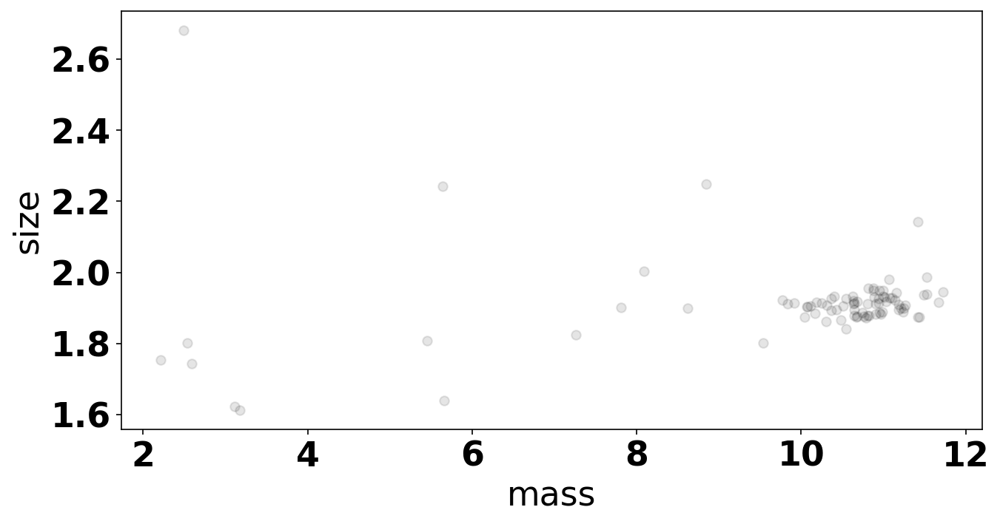

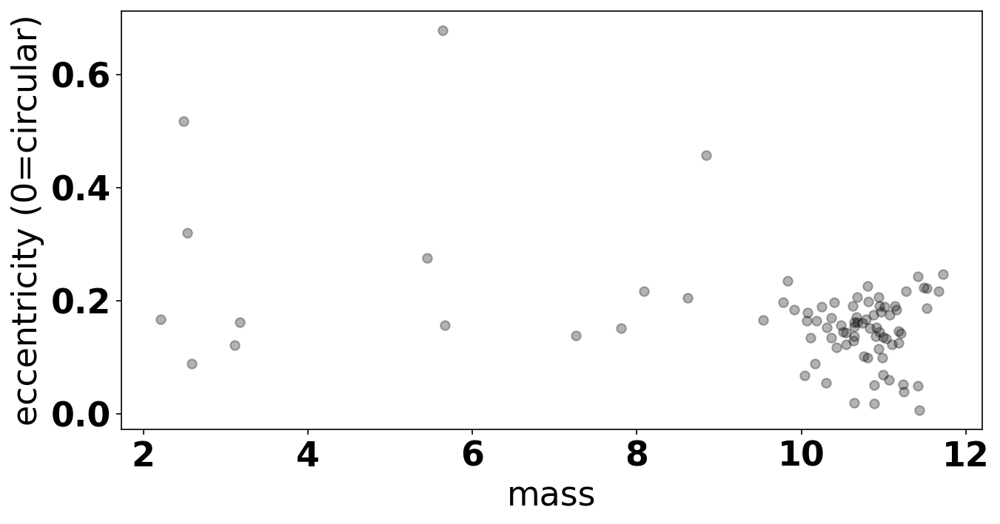

In [13]:
search_kws = {
    'search_range' : 35,
    'adaptive_stop' : 2.0,
    'adaptive_step' : 0.95,
}
t = tp.link(f, **search_kws)
plt.figure()
tp.mass_size(t.groupby('particle').mean()); # convenience function -- just plots size vs. mass
tp.mass_ecc(t.groupby('particle').mean()); # convenience function -- just plots size vs. mass

In [14]:
min_mass, max_mass = 9, 13
min_size, max_size = 1.8, 2.2
min_ecc, max_ecc = 0.05, 0.25
t1 = t[t['ecc'].between(min_ecc, max_ecc) &
       t['size'].between(min_size, max_size) & 
       t['mass'].between(min_mass, max_mass)]
t2 = tp.filter_stubs(t, 30)
# Compare the number of particles in the unfiltered and filtered data.
print('Before:', t['particle'].nunique())
print('After:', t2['particle'].nunique())

Before: 85
After: 19


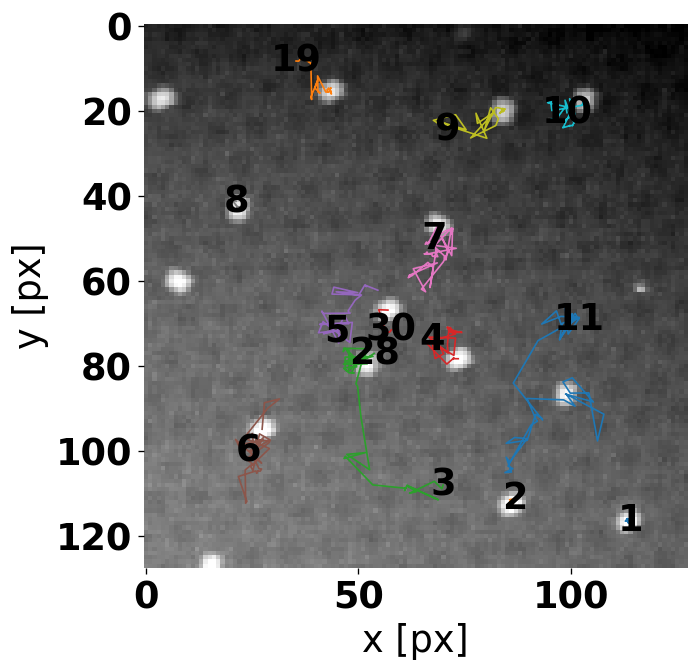

In [15]:
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig=plt.figure(figsize=(8, 6), dpi=120)
ax1=plt.axes(xlim=(0, 256), ylim=(0, 256), frameon=False)
plt.axis('off')
ln, = ax1.plot([], [], lw=3)
ax1.set_prop_cycle(color=['g', 'r', 'c', 'm', 'y', 'k'])
def animate(i):
    plt.cla()
    tp.plot_traj(t2[(t2['frame']<=i+20)], superimpose=frames[i+20], label=True, ax=ax1, plot_style={'alpha' : 1})
    ax1.set_prop_cycle(color=['g', 'r', 'c', 'm', 'y', 'k'])
#     plt.imshow(frames[i], cmap='gray')
# Set up formatting for the movie files
Writer = matplotlib.animation.writers['ffmpeg']
writer = Writer(fps=5, metadata=dict(artist='Me'), bitrate=1800)
line_ani = matplotlib.animation.FuncAnimation(fig, animate, frames=30)
# line_ani.save('claymation.mp4', writer=writer)
line_ani

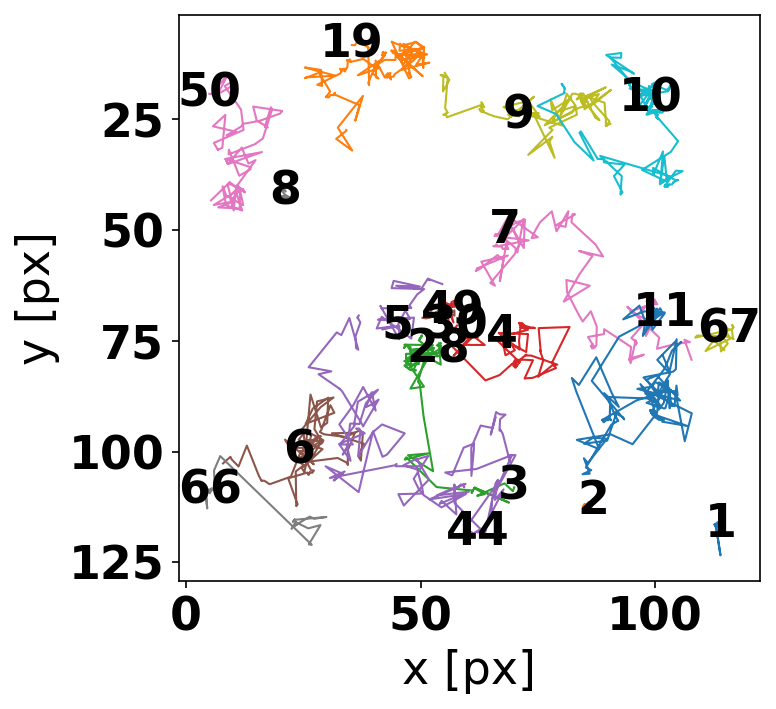

<AxesSubplot:xlabel='x [px]', ylabel='y [px]'>

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(5,5))
t2 = t2[~t2.particle.isin([])] # 10 is double molecule, 11 is near a defect
tp.plot_traj(t2, label=True)

In [17]:
d = tp.compute_drift(t2)
t3 = tp.subtract_drift(t2.copy(), d)
t23 = t3.copy()

## 25K

In [18]:
n_range = range(616, 616+200)
N = len(n_range)
SXM_PATH = ["electromigration_29/Image_{0:03}.sxm".format(i) for i in n_range]
frames = SXMReader(SXM_PATH)
molecule_size = 9
detect_kwargs = {
    'minmass' : 2,
    'maxsize' : 4,
    'separation' : 7,
}
f = tp.batch(frames[:], molecule_size, **detect_kwargs)

Frame 199: 6 features


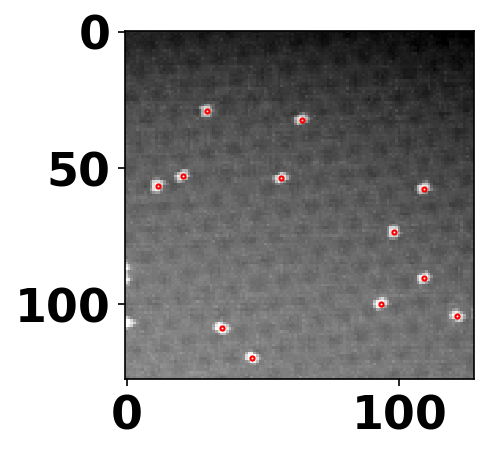

(-0.5, 127.5, 127.5, -0.5)

In [19]:
fig=plt.figure(figsize=(3, 5))
idx = 12
ax = tp.annotate(f[f['frame']==idx], frames[idx], plot_style={'markersize':1})
ax.axis('off')

Frame 199: 6 trajectories present.


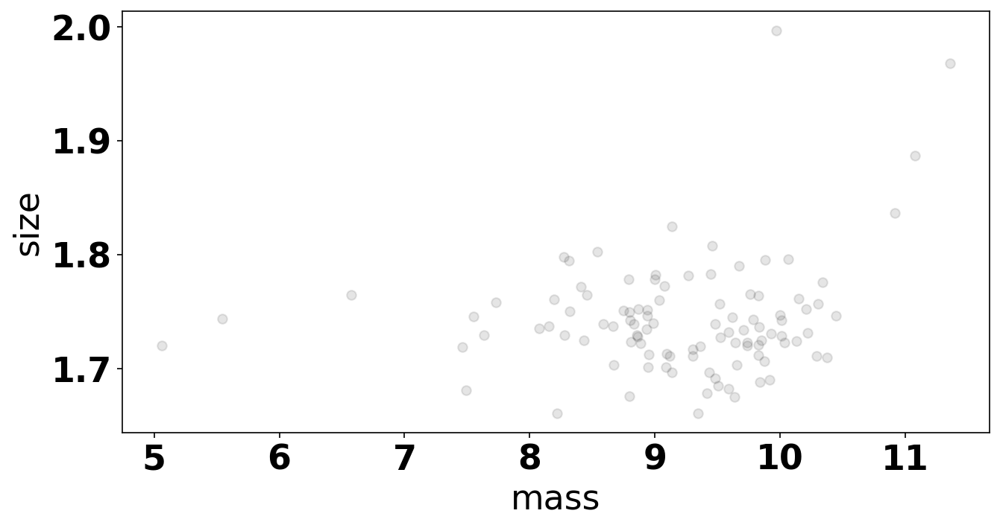

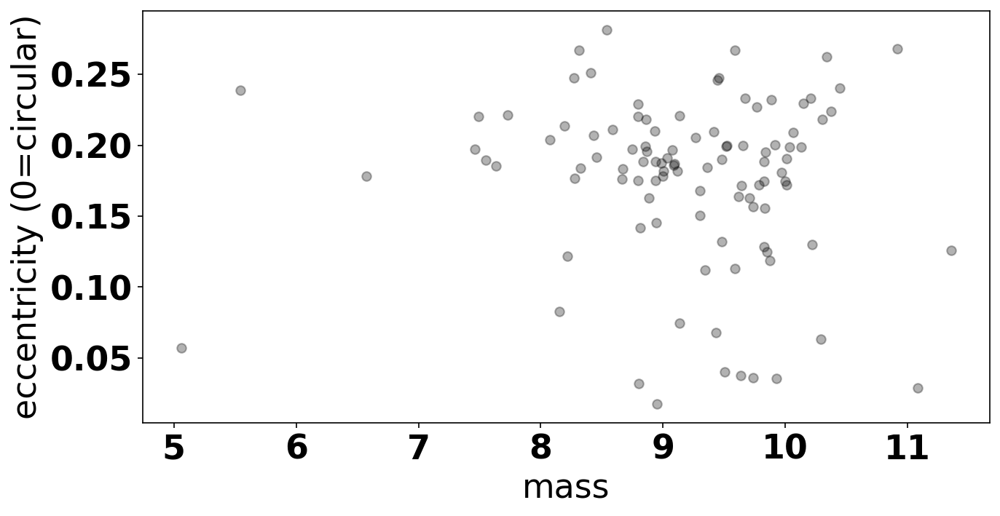

In [20]:
search_kws = {
    'search_range' : 35,
    'adaptive_stop' : 2.0,
    'adaptive_step' : 0.95,
}
t = tp.link(f, **search_kws)
plt.figure()
tp.mass_size(t.groupby('particle').mean()); # convenience function -- just plots size vs. mass
tp.mass_ecc(t.groupby('particle').mean()); # convenience function -- just plots size vs. mass

In [21]:
min_mass, max_mass = 9, 13
min_size, max_size = 1.8, 2.2
min_ecc, max_ecc = 0.05, 0.25
t1 = t[t['ecc'].between(min_ecc, max_ecc) &
       t['size'].between(min_size, max_size) & 
       t['mass'].between(min_mass, max_mass)]
t2 = tp.filter_stubs(t, 30)
# Compare the number of particles in the unfiltered and filtered data.
print('Before:', t['particle'].nunique())
print('After:', t2['particle'].nunique())

Before: 103
After: 11


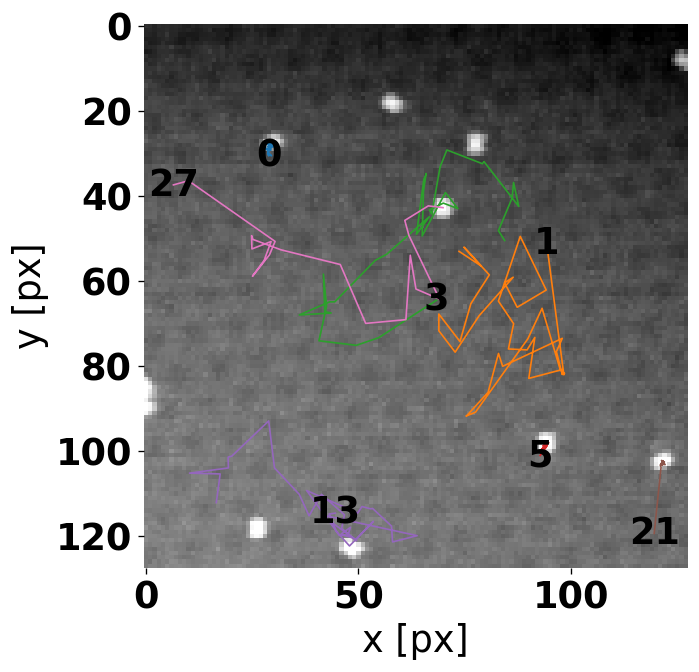

In [22]:
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig=plt.figure(figsize=(8, 6), dpi=120)
ax1=plt.axes(xlim=(0, 256), ylim=(0, 256), frameon=False)
plt.axis('off')
ln, = ax1.plot([], [], lw=3)
ax1.set_prop_cycle(color=['g', 'r', 'c', 'm', 'y', 'k'])
def animate(i):
    plt.cla()
    tp.plot_traj(t2[(t2['frame']<=i+20)], superimpose=frames[i+20], label=True, ax=ax1, plot_style={'alpha' : 1})
    ax1.set_prop_cycle(color=['g', 'r', 'c', 'm', 'y', 'k'])
#     plt.imshow(frames[i], cmap='gray')
# Set up formatting for the movie files
Writer = matplotlib.animation.writers['ffmpeg']
writer = Writer(fps=5, metadata=dict(artist='Me'), bitrate=1800)
line_ani = matplotlib.animation.FuncAnimation(fig, animate, frames=30)
# line_ani.save('claymation.mp4', writer=writer)
line_ani

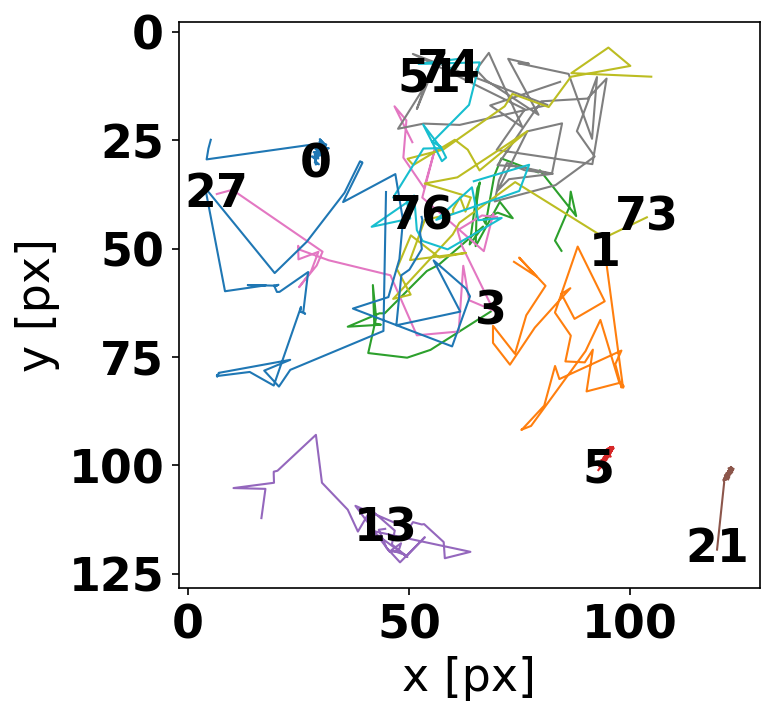

<AxesSubplot:xlabel='x [px]', ylabel='y [px]'>

In [23]:
fig, ax = plt.subplots(1, 1, figsize=(5,5))
t2 = t2[~t2.particle.isin([])] # 0, 5 stuck on defects
tp.plot_traj(t2, label=True)

In [24]:
d = tp.compute_drift(t2)
t3 = tp.subtract_drift(t2.copy(), d)
t25 = t3.copy()

[8.685745456835381, 2.7760345650780907, 1.1803906171173415]


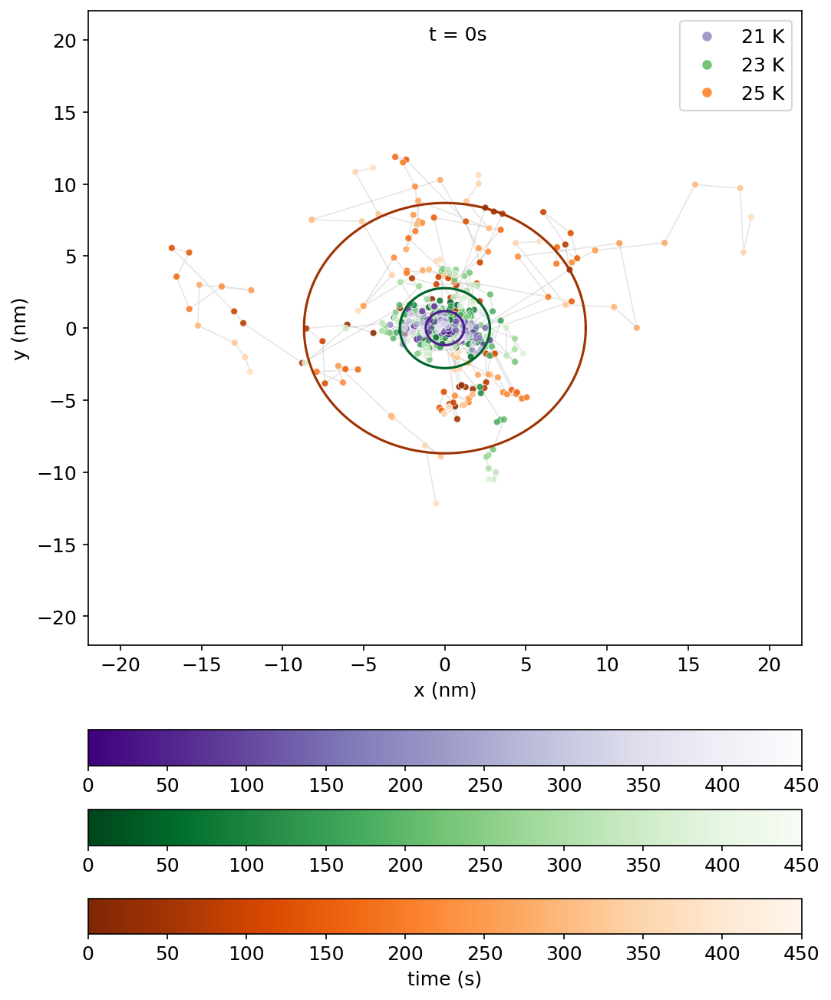

In [113]:
font = {'family' : 'Helvetica',
        'weight' : 'normal',
        'size'   : 12}
import matplotlib
matplotlib.rc('font', **font)

def centered(df):
    df['x_centered'] = df['x'] - df['x'].iloc[0]
    df['y_centered'] = df['y'] - df['y'].iloc[0]
    df['t_centered'] = df['frame'] - df['frame'].iloc[0]
    df['msd'] = np.sqrt(df['x_centered'] **2 + df['y_centered'] ** 2)
    return df.head(16)
c = plt.cm.plasma(np.linspace(0.25, 0.75, 3))
fig, ax = plt.subplots(figsize=(8, 12))
# ax.axhline(0, lw=0.2, alpha=0.8)
# ax.axvline(0, lw=0.2, alpha=0.8)
for df, c, a in zip([t25, t23, t21], ['flare_r', 'light:seagreen_r', 'dark:#69d_r'], [0.9, 0.85, 0.5]):
    df = (df * 50 / 128).groupby('particle').apply(centered).reset_index(drop=True)
    for particle in df.particle.unique():
        tmp = df[df.particle == particle]
        ax.plot(tmp['x_centered'], tmp['y_centered'], alpha=0.1, lw=0.8, color='k', zorder=0)

msds = []
for df, c, a in zip([t25, t23, t21], ['Oranges_r', 'Greens_r', 'Purples_r'], [0.9, 0.85, 0.75]):
    df = (df * 50 / 128).groupby('particle').apply(centered).reset_index(drop=True)
    msds.append(df.groupby('particle').apply(lambda x : x.msd.iloc[-1]).mean())
    for particle in df.particle.unique():
        tmp = df[df.particle == particle]
        hue_norm = (0, tmp.t_centered.max() * 1.2)
        sns.scatterplot(x='x_centered', y='y_centered', size=1, data=tmp, hue='t_centered', hue_norm=hue_norm, palette=c, ax=ax, alpha=a, zorder=1)
#         break
#     break
print(msds)
for msd, c in zip(msds, ['Oranges_r', 'Greens_r', 'Purples_r']):
    angle = np.linspace( 0 , 2 * np.pi , 150 ) 
    c = sns.color_palette(c, as_cmap=True)(0.1)
    radius = msd

    x = radius * np.cos( angle ) 
    y = radius * np.sin( angle )
    ax.plot( x, y, c=c ) 
ax.get_legend().remove()

norm = plt.Normalize(0, 450)
sm = plt.cm.ScalarMappable(cmap="Oranges_r", norm=norm)
sm.set_array([])
cbar = ax.figure.colorbar(sm, pad=-0.05, orientation='horizontal')
cbar.set_label('time (s)')

norm = plt.Normalize(0, 450)
sm = plt.cm.ScalarMappable(cmap="Greens_r", norm=norm)
sm.set_array([])
ax.figure.colorbar(sm, pad=-0.05, orientation='horizontal')

norm = plt.Normalize(0, 450)
sm = plt.cm.ScalarMappable(cmap="Purples_r", norm=norm)
sm.set_array([])
ax.figure.colorbar(sm, pad=0.10, orientation='horizontal')


import matplotlib.lines as mlines
c = ['Oranges_r', 'Greens_r', 'Purples_r']
purple = mlines.Line2D([], [], color=sns.color_palette(c[0], as_cmap=True)(0.5), marker='o', linestyle='None',
                          markersize=5, label='25 K')

green = mlines.Line2D([], [], color=sns.color_palette(c[1], as_cmap=True)(0.5), marker='o', linestyle='None',
                          markersize=5, label='23 K')

orange = mlines.Line2D([], [], color=sns.color_palette(c[2], as_cmap=True)(0.5), marker='o', linestyle='None',
                          markersize=5, label='21 K')

plt.legend(handles=[orange, green, purple])
plt.text(-1, 20, 't = 0s', fontsize = 12)

ax.set_xlabel('x (nm)')
ax.set_ylabel('y (nm)')
ax.set_xlim(-22, 22)
ax.set_ylim(-22, 22)
plt.savefig('exp_traj.svg')

In [ ]:
font = {'family' : 'Helvetica',
        'weight' : 'normal',
        'size'   : 12}
import matplotlib
matplotlib.rc('font', **font)

def centered(df):
    df['x_centered'] = df['x'] - df['x'].iloc[0]
    df['y_centered'] = df['y'] - df['y'].iloc[0]
    df['t_centered'] = df['frame'] - df['frame'].iloc[0]
    df['msd'] = np.sqrt(df['x_centered'] **2 + df['y_centered'] ** 2)
    return df.head(30)
c = plt.cm.plasma(np.linspace(0.25, 0.75, 3))
fig, ax = plt.subplots(figsize=(8, 8))
ax.plot([])
c = ['Oranges_r', 'Greens_r', 'Purples_r']
import matplotlib.lines as mlines
purple = mlines.Line2D([], [], color=sns.color_palette(c[0], as_cmap=True)(0.5), marker='o', linestyle='None',
                          markersize=5, label='25 K')

green = mlines.Line2D([], [], color=sns.color_palette(c[1], as_cmap=True)(0.5), marker='o', linestyle='None',
                          markersize=5, label='23 K')

orange = mlines.Line2D([], [], color=sns.color_palette(c[2], as_cmap=True)(0.5), marker='o', linestyle='None',
                          markersize=5, label='21 K')

plt.legend(handles=[orange, green, purple])

ax.set_xlabel('x (nm)')
ax.set_ylabel('y (nm)')
ax.set_xlim(-22, 22)
ax.set_ylim(-22, 22)

dfs, cs, alphas = [(df * 50 / 128).groupby('particle').apply(centered).reset_index(drop=True) for df in [t25, t23, t21]], ['Oranges_r', 'Greens_r', 'Purples_r'], [0.9, 0.85, 0.75]
dfs, cs, alphas = dfs[::-1], cs[::-1], alphas[::-1]
all_ts = [len(df.t_centered.unique()) for df in dfs]
total_ts = np.cumsum(all_ts)
texts = []

from matplotlib.animation import FuncAnimation
import bisect
from tqdm import tqdm
def AnimationFunction(frame):
    if len(texts) > 0:
        texts[-1].set_visible(False)
    idx = bisect.bisect_left(total_ts, frame)
    offset = frame - 1 if idx == 0 else frame - total_ts[idx - 1] - 1
    offset = max(0, offset)
    df, c, alpha = dfs[idx], cs[idx], alphas[idx]
#     df = (df * 50 / 128).groupby('particle').apply(centered).reset_index(drop=True)
    t_up = df.t_centered.unique()[offset]
    for particle in df.particle.unique():
        tmp = df[(df.particle == particle) & (df.t_centered <= t_up)]
        hue_norm = (0, tmp.t_centered.max() * 1.2)
        sns.scatterplot(x='x_centered', y='y_centered', size=1, data=tmp, hue='t_centered', hue_norm=hue_norm, palette=c, ax=ax, alpha=a, zorder=1)
        ax.get_legend().remove()
        plt.legend(handles=[orange, green, purple])
        line = ax.plot(tmp['x_centered'], tmp['y_centered'], alpha=0.1, lw=0.8, color='k', zorder=0)
    texts.append(plt.text(-2, 20, f't = {(frame % 30) * 15}s', fontsize = 12))
    return line
        
        
anim = FuncAnimation(fig, AnimationFunction,
                               frames=tqdm(range(total_ts[-1])), interval=100, blit=True, save_count=90)
anim










  0%|          | 0/90 [00:00<?, ?it/s]








  1%|          | 1/90 [00:03<04:36,  3.11s/it]








  2%|▏         | 2/90 [00:05<04:20,  2.96s/it]








  3%|▎         | 3/90 [00:08<04:20,  3.00s/it]








  4%|▍         | 4/90 [00:12<04:37,  3.23s/it]








  6%|▌         | 5/90 [00:17<05:14,  3.70s/it]








  7%|▋         | 6/90 [00:23<06:03,  4.33s/it]








  8%|▊         | 7/90 [00:30<07:08,  5.16s/it]








  9%|▉         | 8/90 [00:38<08:24,  6.15s/it]








 10%|█         | 9/90 [01:06<16:57, 12.56s/it]








 11%|█         | 10/90 [01:17<16:22, 12.28s/it]








 12%|█▏        | 11/90 [01:31<16:37, 12.62s/it]








 13%|█▎        | 12/90 [01:45<16:56, 13.03s/it]








 14%|█▍        | 13/90 [02:00<17:34, 13.69s/it]








 16%|█▌        | 14/90 [02:17<18:24, 14.53s/it]








 17%|█▋        | 15/90 [02:34<19:18, 15.45s/it]








 18%|█▊        | 16/90 [03:08<25:46, 20.90s/it]








 19%|█▉        | 17/90 [03:29<25:30, 20.96s/it]








 

In [ ]:
from matplotlib import rc
rc('animation', html='html5')
anim

In [ ]:
from matplotlib import animation
f = 'animation.avi'
plt.clf()
writervideo = animation.FFMpegWriter(fps=20)
anim.save(f, writer=writervideo)

/home/a/as/asai/dsgo/venv/lib/python3.7/site-packages/pandas/core/series.py:856: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/a/as/asai/dsgo/venv/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in sqrt


8
19
11


findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


[0.08172992 0.07718686] [[0.01110829        nan]
 [       nan 0.07327513]] 7.9712511092691045
[0.08172992 0.07718686] [[0.01110829        nan]
 [       nan 0.07327513]] 36.03578881190726
[0.08172992 0.07718686] [[0.01110829        nan]
 [       nan 0.07327513]] 127.1987315507892


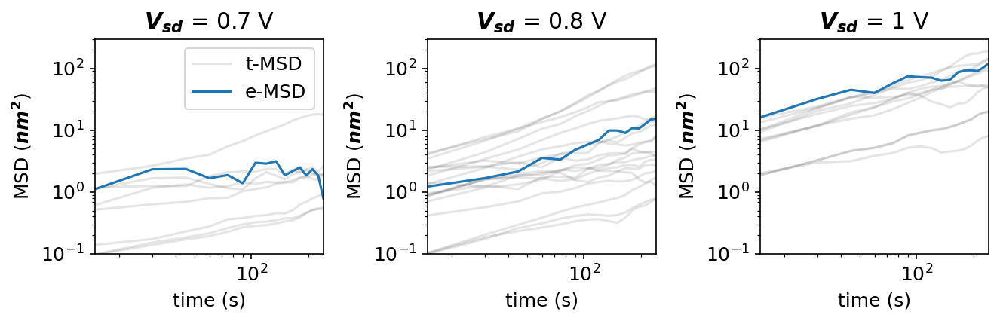

In [27]:
from scipy.optimize import curve_fit
fig, ax = plt.subplots(1, 3, figsize=(9, 3))
voltages = [0.7, 0.8, 1]
ps, covs, last = [], [], []
f = lambda x, a, b : a * x + b
for i, df in enumerate([t21, t23, t25]):
    df = df.groupby('particle').apply(centered).reset_index(drop=True)
    im = tp.imsd(df, frames.meters_per_pixel * 1e6, 1/15, max_lagtime=16) * 1e6
    ax[i].plot(im.index, im , 'k-', alpha=0.1)  # black lines, semitransparent
    ax[i].plot([1e-9], [1e-9], 'k-', alpha=0.1, label='t-MSD')
    df = df * 50 / 128
#     for p in df['particle'].unique():
#         tmp = df[df.particle == p]
#         ax[i].plot(tmp['t_centered'] * 128 / 50 * 15, tmp['msd'], color='k', alpha=0.2)
    df['msd'] = df['msd'] ** 2
    emsd = df.groupby('t_centered')['msd'].mean().reset_index(drop=True)
    ax[i].plot(df.t_centered.unique() * 128 / 50 * 15, emsd, label='e-MSD')
    last.append(emsd.iloc[-1])
    df['msd'] = np.log(df['msd'])
    df['t_centered'] = np.log(df['t_centered'])
    tmp = tmp.replace([np.inf, -np.inf], np.nan, inplace=False).dropna(subset=["t_centered", "msd"], how="any")
    popt, popcov = curve_fit(f, tmp['t_centered'], tmp['msd'])
    ps.append(popt)
    print(len(df.particle.unique()))
    covs.append(np.sqrt(popcov))
    ax[i].set_title("$V_{sd}$ = " + "{} V".format(voltages[i]))
    ax[i].set_ylabel('MSD ($nm^2$)')
    ax[i].set_xlabel('time (s)')
    ax[i].set_xscale('log')
    ax[i].set_yscale('log')
    if i == 0:
        ax[i].legend()
    ax[i].set_xlim(15, 240)
    ax[i].set_ylim(1e-1, 3e2)
    x = np.linspace(0, 100, 2)
    y = 1e-2 * x
#     if i == 0: ax[i].plot(x, y, '--')
fig.tight_layout()
for p, c, l in zip(ps, covs, last):
    print(p, c, l)
plt.savefig('exp_msds.svg')

In [28]:
last

[7.9712511092691045, 36.03578881190726, 127.1987315507892]